In [24]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm

Install Dataset

In [2]:
!pip install -U -q kaggle
!mkdir -p ~/.kaggle && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

mv: cannot stat 'kaggle.json': No such file or directory


In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"putrizhalianti","key":"1b418321e8427e1f2467fe7058487ae3"}'}

In [4]:
!cp kaggle.json ~/.kaggle/

In [5]:
!kaggle datasets list

ref                                                                     title                                                     size  lastUpdated                 downloadCount  voteCount  usabilityRating  
----------------------------------------------------------------------  --------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
urvishahir/electric-vehicle-specifications-dataset-2025                 Electric Vehicle Specs Dataset (2025)                    16631  2025-06-20 07:14:56.777000           6932        174  1.0              
divyaraj2006/social-media-engagement                                    social media engagement                                   2142  2025-07-02 15:34:21.323000           3159         65  1.0              
sahilislam007/college-student-placement-factors-dataset                 College Student Placement Factors Dataset               110450  2025-07-02 08:33:50.547000      

In [6]:
!kaggle datasets download junkal/flowerdatasets
!ls

Dataset URL: https://www.kaggle.com/datasets/junkal/flowerdatasets
License(s): unknown
 94% 506M/536M [00:01<00:00, 347MB/s]
100% 536M/536M [00:01<00:00, 433MB/s]
flowerdatasets.zip  kaggle.json  sample_data


In [7]:
!unzip flowerdatasets.zip -d testtt

Streaming output truncated to the last 5000 lines.
  inflating: testtt/flowers/train/rose/370872334_4765d8b086_o.jpg  
  inflating: testtt/flowers/train/rose/37135456215_8ee0e71fbc_k.jpg  
  inflating: testtt/flowers/train/rose/37209953126_87b1ddff10_k.jpg  
  inflating: testtt/flowers/train/rose/37216485931_0e0d232fcd_k.jpg  
  inflating: testtt/flowers/train/rose/37236772855_eb2f32b1af_k.jpg  
  inflating: testtt/flowers/train/rose/37421104851_9f66cda177_k.jpg  
  inflating: testtt/flowers/train/rose/37451725494_21db5e7ea8_k.jpg  
  inflating: testtt/flowers/train/rose/37526965574_ae6b1159bf_k.jpg  
  inflating: testtt/flowers/train/rose/37537007156_07aaad7f31_k.jpg  
  inflating: testtt/flowers/train/rose/3769935473_4a141ee8e8_o.jpg  
  inflating: testtt/flowers/train/rose/37867371406_89de9f78d4_k.jpg  
  inflating: testtt/flowers/train/rose/3792450522_0df34f72ba_o.jpg  
  inflating: testtt/flowers/train/rose/38039351116_d2e58ab616_k.jpg  
  inflating: testtt/flowers/train/rose/3809

# Setup and Config

In [4]:
def download_kaggle_dataset(dataset_path):
    os.system('pip install -q kaggle')

    if not os.path.isfile('kaggle.json'):
        print("kaggle.json file not found. Please upload it.")
        return

    os.system('mkdir -p ~/.kaggle')
    os.system('cp kaggle.json ~/.kaggle/')
    os.system('chmod 600 ~/.kaggle/kaggle.json')

    os.system(f'kaggle datasets download -d {dataset_path}')
    zip_file = f'{dataset_path.split("/")[-1]}.zip'
    os.system(f'unzip -q {zip_file}')

download_kaggle_dataset('junkal/flowerdatasets')

# Data Loading


In [9]:
def load_data(dataset_path):
    images, labels = [], []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    return pd.DataFrame({'image': images, 'label': labels})

# Load train, test, and validation data
train_data = load_data('/content/testtt/flowers/train')
test_data = load_data('/content/testtt/flowers/test')
val_data = load_data('/content/testtt/flowers/val')

In [10]:
print(train_data.head())
print(train_data['label'].value_counts())

                                               image  label
0  /content/testtt/flowers/train/tulip/2709098078...  tulip
1  /content/testtt/flowers/train/tulip/94192080_b...  tulip
2  /content/testtt/flowers/train/tulip/138146082_...  tulip
3  /content/testtt/flowers/train/tulip/8650508199...  tulip
4  /content/testtt/flowers/train/tulip/7811939454...  tulip
label
orchid       1288
daisy        1223
sunflower    1198
lily         1129
tulip        1120
rose         1042
dandelion    1039
Name: count, dtype: int64


# Visualization of Dataset


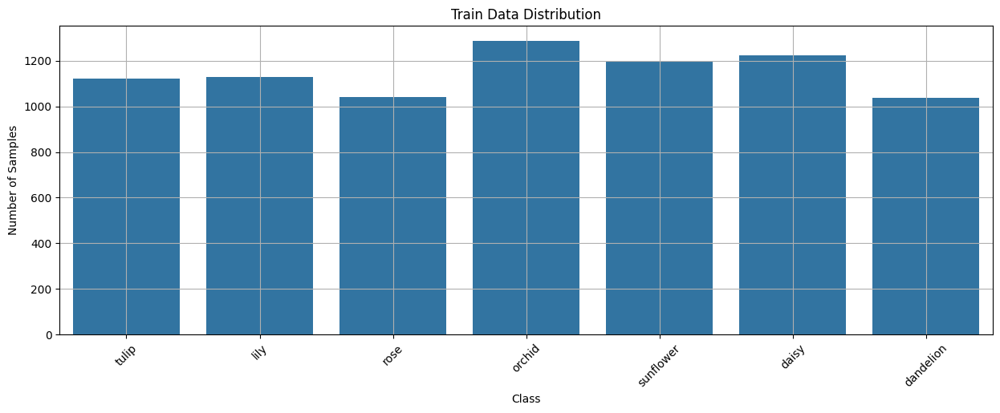

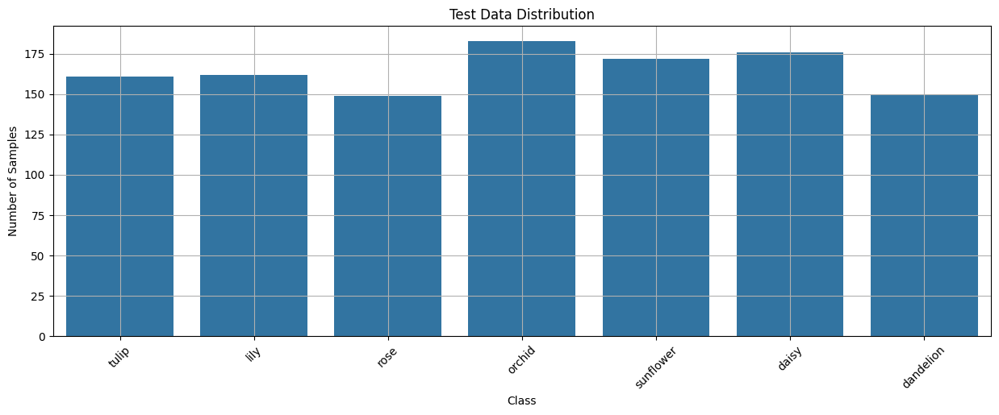

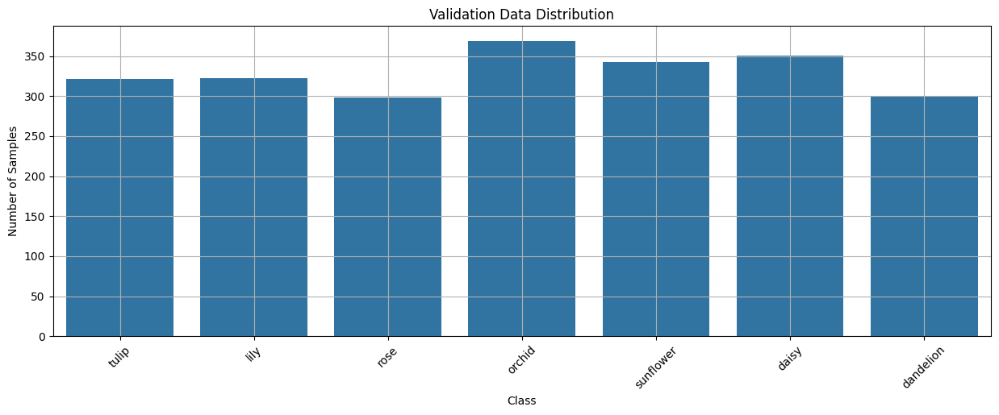

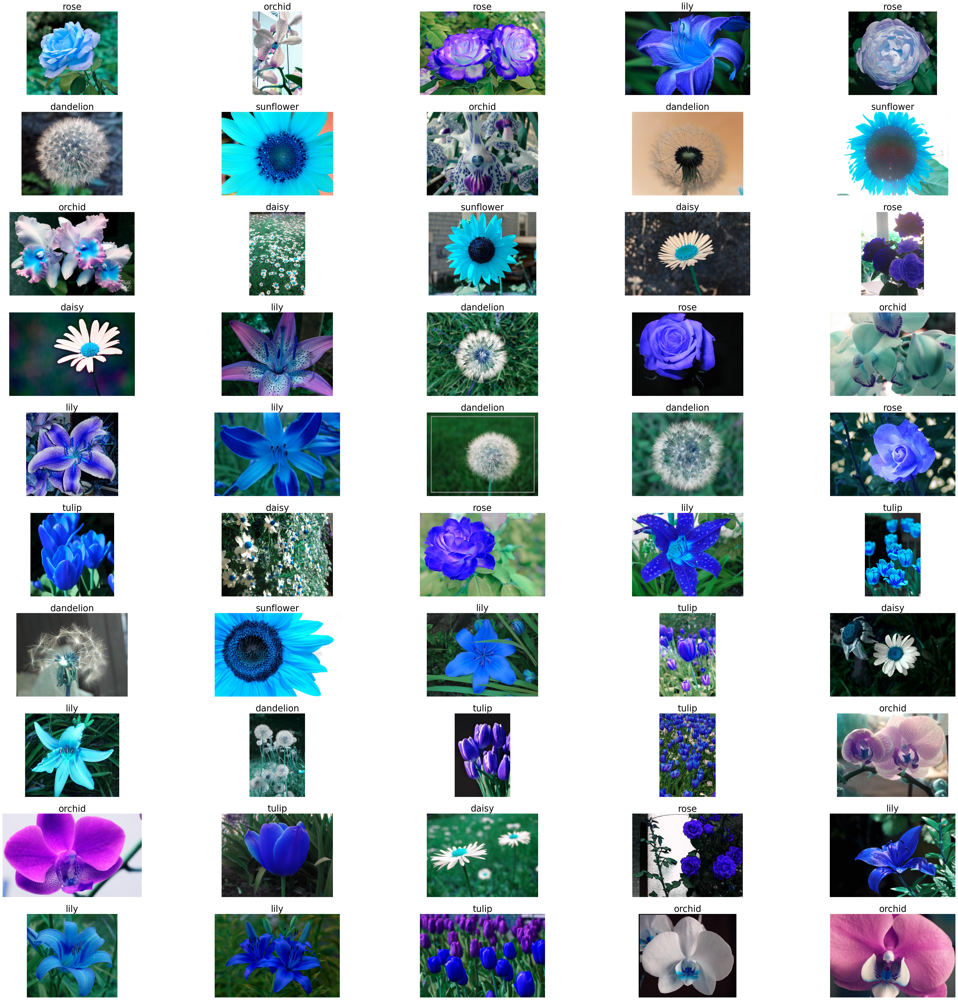

In [11]:
def plot_data_distribution(data, title):
    plt.figure(figsize=(15, 5))
    sns.countplot(x=data['label'])
    plt.xlabel("Class")
    plt.ylabel("Number of Samples")
    plt.title(title)
    plt.xticks(rotation=45)
    plt.grid(True)

plot_data_distribution(train_data, 'Train Data Distribution')
plot_data_distribution(test_data, 'Test Data Distribution')
plot_data_distribution(val_data, 'Validation Data Distribution')

def display_sample_images(data, num_samples=10):
    plt.figure(figsize=(50, 50))
    for i, idx in enumerate(np.random.randint(0, len(data), num_samples)):
        plt.subplot(10, 5, i + 1)
        img = cv2.imread(data.iloc[idx]['image'])
        plt.imshow(img)
        plt.axis('off')
        plt.title(data.iloc[idx]['label'], fontsize=25)

# Sample Image dari data train
display_sample_images(train_data, 50)


# Data Augmentation


In [12]:
train_path = '/content/testtt/flowers/train'
test_path = '/content/testtt/flowers/test'
img_size = (150, 150)
batch_size = 32

In [26]:
# Generator dengan augmentasi dan pembagian validasi 20%
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)

# Mengacak dataframe
train_data = train_data.sample(frac=1).reset_index(drop=True)

# Generator untuk data pelatihan
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory='/content/testtt/flowers/train',
    x_col='image',
    y_col='label',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

# Generator untuk data validasi
validation_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory='/content/testtt/flowers/train',
    x_col='image',
    y_col='label',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

Found 6432 validated image filenames belonging to 7 classes.
Found 1607 validated image filenames belonging to 7 classes.


In [27]:
print(train_generator.class_indices)

{'daisy': 0, 'dandelion': 1, 'lily': 2, 'orchid': 3, 'rose': 4, 'sunflower': 5, 'tulip': 6}


# Modeling

In [28]:
# Membangun model CNN
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    layers.MaxPooling2D(2, 2),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),

    layers.Flatten(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),

    layers.Dense(7, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

# Menyimpan model
model.save('flower_classification_model.h5')


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,829,255 (18.42 MB)

 Trainable params: 4,829,255 (18.42 MB)

 Non-trainable params: 0 (0.00 B)

In [30]:
early_stop = EarlyStopping(monitor='val_loss', patience=3)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True)

# Kompilasi model sebelum pelatihan
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Melatih model
history = model.fit(
    train_generator,
    epochs=20,
    validation_data=validation_generator,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - accuracy: 0.6498 - loss: 0.9620

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


201/201 ━━━━━━━━━━━━━━━━━━━━ 62s 293ms/step - accuracy: 0.6500 - loss: 0.9614 - val_accuracy: 0.7834 - val_loss: 0.6285
Epoch 2/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - accuracy: 0.7801 - loss: 0.6277

201/201 ━━━━━━━━━━━━━━━━━━━━ 67s 335ms/step - accuracy: 0.7801 - loss: 0.6277 - val_accuracy: 0.8251 - val_loss: 0.5119
Epoch 3/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8159 - loss: 0.5064

201/201 ━━━━━━━━━━━━━━━━━━━━ 58s 287ms/step - accuracy: 0.8159 - loss: 0.5064 - val_accuracy: 0.8426 - val_loss: 0.4736
Epoch 4/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - accuracy: 0.8488 - loss: 0.4387

201/201 ━━━━━━━━━━━━━━━━━━━━ 58s 289ms/step - accuracy: 0.8488 - loss: 0.4388 - val_accuracy: 0.8475 - val_loss: 0.4594
Epoch 5/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8615 - loss: 0.3974

201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 282ms/step - accuracy: 0.8616 - loss: 0.3974 - val_accuracy: 0.8799 - val_loss: 0.3612
Epoch 6/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 58s 286ms/step - accuracy: 0.8852 - loss: 0.3364 - val_accuracy: 0.8706 - val_loss: 0.3797
Epoch 7/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - accuracy: 0.8931 - loss: 0.3224

201/201 ━━━━━━━━━━━━━━━━━━━━ 58s 289ms/step - accuracy: 0.8931 - loss: 0.3225 - val_accuracy: 0.8961 - val_loss: 0.3357
Epoch 8/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 58s 288ms/step - accuracy: 0.8902 - loss: 0.3239 - val_accuracy: 0.8743 - val_loss: 0.3987
Epoch 9/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9023 - loss: 0.2969

201/201 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - accuracy: 0.9023 - loss: 0.2969 - val_accuracy: 0.8998 - val_loss: 0.3147
Epoch 10/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 284ms/step - accuracy: 0.9183 - loss: 0.2384 - val_accuracy: 0.8874 - val_loss: 0.3411
Epoch 11/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 58s 287ms/step - accuracy: 0.9114 - loss: 0.2465 - val_accuracy: 0.8712 - val_loss: 0.3687
Epoch 12/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - accuracy: 0.9166 - loss: 0.2460

201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 282ms/step - accuracy: 0.9166 - loss: 0.2460 - val_accuracy: 0.9060 - val_loss: 0.3022
Epoch 13/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 286ms/step - accuracy: 0.9218 - loss: 0.2374 - val_accuracy: 0.8973 - val_loss: 0.3195
Epoch 14/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.9207 - loss: 0.2279

201/201 ━━━━━━━━━━━━━━━━━━━━ 58s 287ms/step - accuracy: 0.9206 - loss: 0.2280 - val_accuracy: 0.9067 - val_loss: 0.2984
Epoch 15/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 282ms/step - accuracy: 0.9336 - loss: 0.1957 - val_accuracy: 0.9060 - val_loss: 0.3027
Epoch 16/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.9291 - loss: 0.2061

201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 286ms/step - accuracy: 0.9292 - loss: 0.2061 - val_accuracy: 0.9116 - val_loss: 0.2781
Epoch 17/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.9415 - loss: 0.1731

201/201 ━━━━━━━━━━━━━━━━━━━━ 58s 288ms/step - accuracy: 0.9414 - loss: 0.1731 - val_accuracy: 0.9228 - val_loss: 0.2564
Epoch 18/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.9491 - loss: 0.1500

201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 284ms/step - accuracy: 0.9491 - loss: 0.1501 - val_accuracy: 0.9247 - val_loss: 0.2536
Epoch 19/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 285ms/step - accuracy: 0.9321 - loss: 0.1960 - val_accuracy: 0.9085 - val_loss: 0.2782
Epoch 20/20
201/201 ━━━━━━━━━━━━━━━━━━━━ 57s 286ms/step - accuracy: 0.9429 - loss: 0.1699 - val_accuracy: 0.9210 - val_loss: 0.2491


# Evaluation and Visualization of Model Performance


In [31]:
# Generator untuk data uji (tanpa augmentasi, hanya normalisasi)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_data,
    directory='/content/testtt/flowers/test',
    x_col="image",
    y_col="label",
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Mendapatkan label sebenarnya dalam bentuk angka
y_test = test_generator.classes

# Mendapatkan mapping label
class_indices = test_generator.class_indices
print("Class mapping:", class_indices)

# Melakukan prediksi
print("Generating predictions on test data...")
predictions = model.predict(test_generator)

# Mengambil indeks dengan probabilitas tertinggi
y_pred = np.argmax(predictions, axis=1)

# Menghitung akurasi
accuracy = accuracy_score(y_test, y_pred)
print(f'Akurasi pada data uji: {accuracy:.4f}')


Found 1153 validated image filenames belonging to 7 classes.
Class mapping: {'daisy': 0, 'dandelion': 1, 'lily': 2, 'orchid': 3, 'rose': 4, 'sunflower': 5, 'tulip': 6}
Generating predictions on test data...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step
Akurasi pada data uji: 0.9332


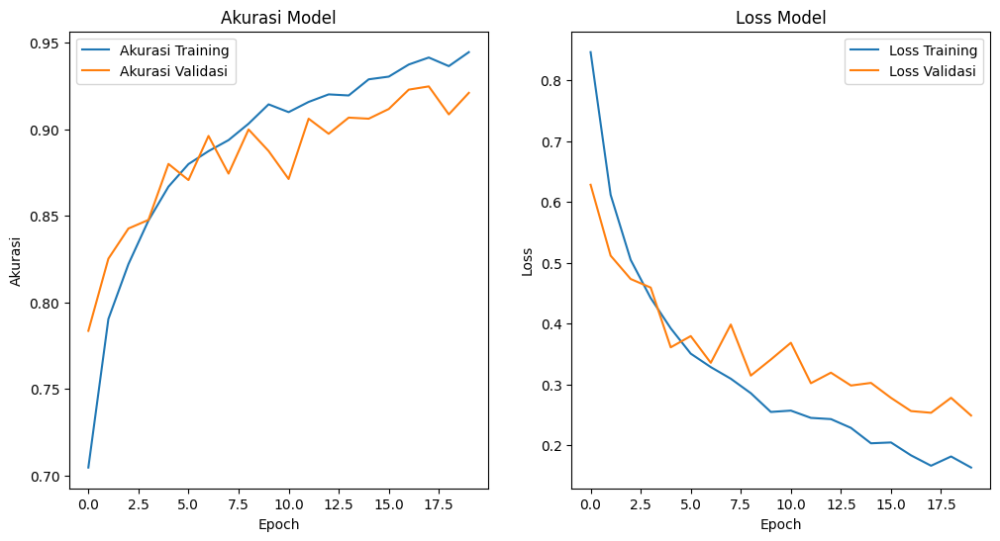

In [32]:
# Visualisasi Akurasi dan Loss
plt.figure(figsize=(12, 6))

# Akurasi
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Akurasi Training')
plt.plot(history.history['val_accuracy'], label='Akurasi Validasi')
plt.title('Akurasi Model')
plt.xlabel('Epoch')
plt.ylabel('Akurasi')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Loss Training')
plt.plot(history.history['val_loss'], label='Loss Validasi')
plt.title('Loss Model')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

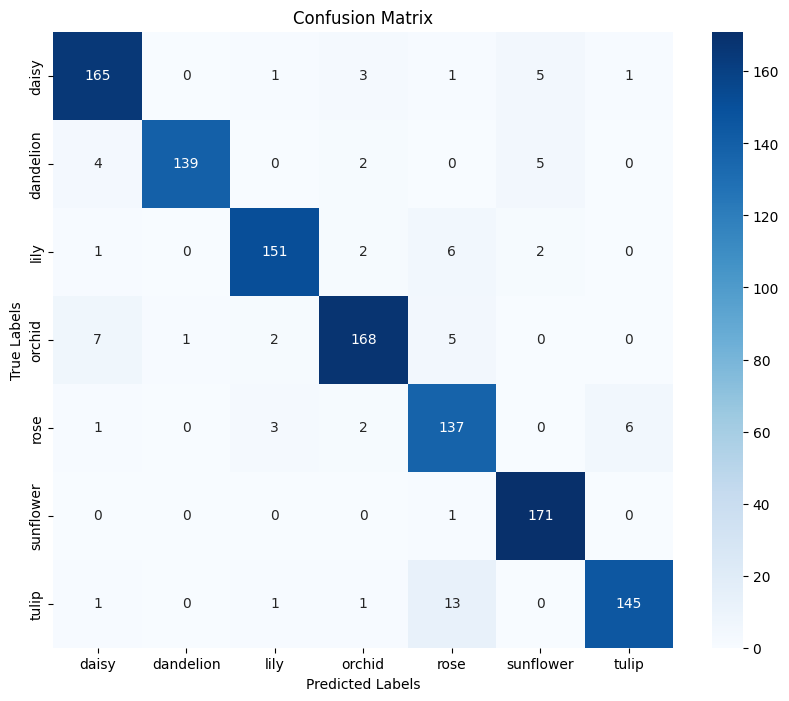

Classification Report:0.9332

              precision    recall  f1-score   support

       daisy       0.92      0.94      0.93       176
   dandelion       0.99      0.93      0.96       150
        lily       0.96      0.93      0.94       162
      orchid       0.94      0.92      0.93       183
        rose       0.84      0.92      0.88       149
   sunflower       0.93      0.99      0.96       172
       tulip       0.95      0.90      0.93       161

    accuracy                           0.93      1153
   macro avg       0.93      0.93      0.93      1153
weighted avg       0.94      0.93      0.93      1153



In [39]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Visualisasi confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_indices.keys(),
            yticklabels=class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Classification report
report = classification_report(y_test, y_pred, target_names=class_indices.keys())
print(f"Classification Report:{accuracy:.4f}\n")
print(report)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


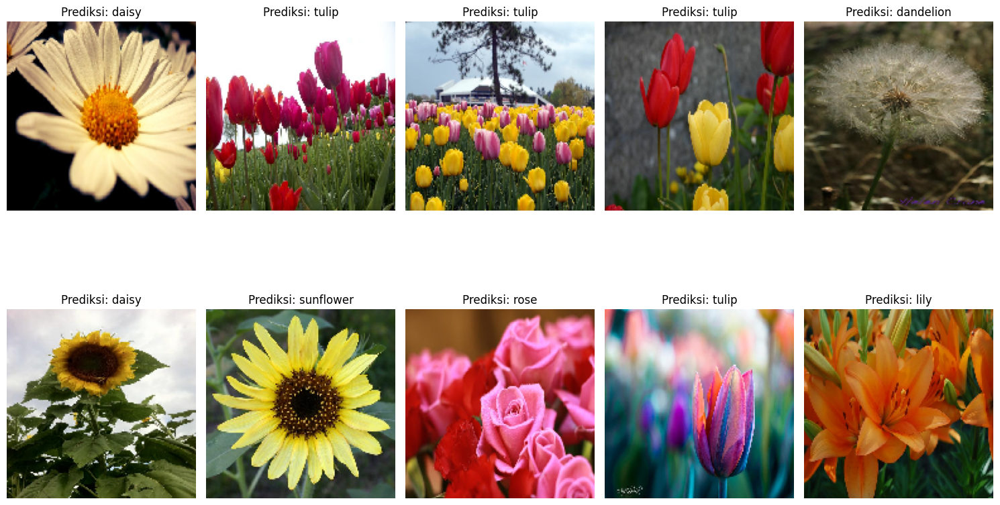

In [35]:
# Load model yang sudah dilatih
model = load_model('best_model.h5')

# Kelas target (urutannya harus sama seperti saat training)
class_names = ['daisy', 'dandelion', 'lily', 'orchid', 'rose', 'sunflower', 'tulip']  # Sesuaikan jika berbeda

# Ambil 10 gambar dari test_data
sample_images = test_data.sample(10).reset_index(drop=True)  # pastikan 'test_data' adalah DataFrame dengan kolom 'image'

# Direktori gambar
image_dir = '/content/testtt/flowers/test'  # ganti sesuai dengan path datasetmu

# Prediksi dan tampilkan
plt.figure(figsize=(15, 10))
for i in range(10):
    # Correcting image path access
    img_path = sample_images['image'][i] # The 'image' column already contains the full path
    img = load_img(img_path, target_size=(150, 150))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array)
    predicted_class = class_names[np.argmax(prediction)]

    # Tampilkan gambar dan prediksi
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(f'Prediksi: {predicted_class}')
    plt.axis('off')

plt.tight_layout()
plt.show()